In [4]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = '0'

In [3]:
import tensorflow as tf
import keras
from keras.models import Sequential, Model
from keras import layers, applications, optimizers
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation,GlobalMaxPooling2D
from keras.preprocessing.image import ImageDataGenerator, load_img

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.image import imread
import cv2
import random

In [5]:
tf.debugging.set_log_device_placement(True)

a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
b = tf.constant([[1.0, 2.0], [3.0, 4.0], [5.0, 6.0]])
c = tf.matmul(a, b)
print(c)

tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32)


In [6]:
image_size = 224
batch_size = 32

save_model_filename = 'cassava.h5'

In [7]:
train = pd.read_csv('./cassava-leaf-disease-classification/train.csv')

In [8]:
train.head(10)

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3
5,1000837476.jpg,3
6,1000910826.jpg,2
7,1001320321.jpg,0
8,1001723730.jpg,4
9,1001742395.jpg,3


In [9]:
data = {"0":"Cassava Bacterial Blight (CBB)",
        "1":"Cassava Brown Streak Disease (CBSD)",
        "2":"Cassava Green Mottle (CGM)",
        "3":"Cassava Mosaic Disease (CMD)",
        "4":"Healthy"}

disease_label = pd.DataFrame(data=data.values(),index=data.keys(),columns=['Disease_Name'])

In [10]:
disease_label

,Disease_Name
0,Cassava Bacterial Blight (CBB)
1,Cassava Brown Streak Disease (CBSD)
2,Cassava Green Mottle (CGM)
3,Cassava Mosaic Disease (CMD)
4,Healthy


In [11]:
train_path = './cassava-leaf-disease-classification/train_images'

In [12]:
def image_path(image):
    return os.path.join(train_path,image)

train['image_id'] = train['image_id'].apply(image_path)

In [13]:
train.head(10)

,image_id,label
0,./cassava-leaf-disease-classification/train_im...,0
1,./cassava-leaf-disease-classification/train_im...,3
2,./cassava-leaf-disease-classification/train_im...,1
3,./cassava-leaf-disease-classification/train_im...,1
4,./cassava-leaf-disease-classification/train_im...,3
5,./cassava-leaf-disease-classification/train_im...,3
6,./cassava-leaf-disease-classification/train_im...,2
7,./cassava-leaf-disease-classification/train_im...,0
8,./cassava-leaf-disease-classification/train_im...,4
9,./cassava-leaf-disease-classification/train_im...,3


In [14]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21397 entries, 0 to 21396
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image_id  21397 non-null  object
 1   label     21397 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 334.5+ KB


In [15]:
train['label'] = train['label'].astype('str')

C:\Users\pomat\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


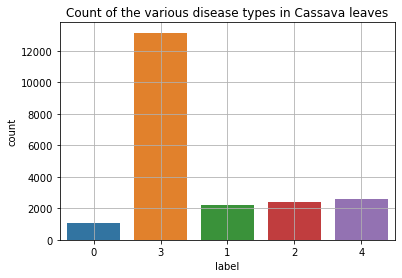

In [16]:
import seaborn as sns

sns.countplot(train['label'])
plt.title('Count of the various disease types in Cassava leaves')
plt.grid()
plt.show()

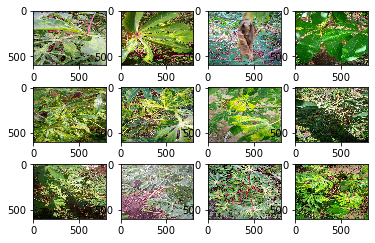

In [17]:
n_rows = 3
n_cols = 4

for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        plt.subplot(n_rows, n_cols, index+1)
        
        leaf_img = np.random.randint(0, len(train))
        img = imread(train.iloc[leaf_img]['image_id'])
        
        plt.imshow(img, cmap='binary',interpolation='nearest')

In [18]:
image_generator = ImageDataGenerator(rotation_range=15, horizontal_flip=True, vertical_flip=True,
                                     shear_range=0.2, zoom_range=0.2, fill_mode='nearest', 
                                     validation_split=0.2, rescale = 1./255,
                                     preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

In [19]:
train_generator = image_generator.flow_from_dataframe(dataframe=train, directory=None, x_col='image_id', y_col='label',
                                                      subset='training', color_mode='rgb', batch_size=batch_size, seed=42,
                                                      shuffle=True, class_mode='categorical', target_size=(image_size,image_size))

Found 17118 validated image filenames belonging to 5 classes.


In [20]:
validation_generator = image_generator.flow_from_dataframe(dataframe=train, directory=None, x_col='image_id', y_col='label',
                                                   subset='validation', color_mode='rgb', batch_size=batch_size, seed=42,
                                                   shuffle=False, class_mode='categorical', target_size=(image_size,image_size))

Found 4279 validated image filenames belonging to 5 classes.


In [19]:
%reload_ext tensorboard

import datetime

In [20]:
def build_vgg_block(input_layer, num_cnn=3, channel=64, block_num=1):
    x = input_layer
    
    for cnn_num in range(num_cnn):
        x = keras.layers.Conv2D(
            filters=channel,
            kernel_size=(3,3),
            activation='relu',
            kernel_initializer='he_normal',
            padding='same',
            name=f'block{block_num}_conv{cnn_num}')(x)

    x = keras.layers.MaxPooling2D(
        pool_size=(2, 2),
        strides=2,
        name=f'block{block_num}_pooling')(x)

    return x

In [21]:
def build_vgg(input_shape=(image_size,image_size,3),
              num_cnn_list=[2,2,3,3,3],
              channel_list=[64,128,256,512,512],
              num_classes=5):
    input_layer = keras.layers.Input(shape=input_shape)
    output = input_layer
    
    for i, (num_cnn, channel) in enumerate(zip(num_cnn_list, channel_list)):
        output = build_vgg_block(
            output,
            num_cnn=num_cnn, 
            channel=channel,
            block_num=i
    )
        
    output = keras.layers.Flatten(name='flatten')(output)
    output = keras.layers.Dense(4096, activation='relu', kernel_regularizer='l2', name='fc1')(output)
    output = keras.layers.Dropout(0.5)(output)
    output = keras.layers.Dense(4096, activation='relu', kernel_regularizer='l2', name='fc2')(output)
    output = keras.layers.Dropout(0.5)(output)
    output = keras.layers.Dense(num_classes, activation='softmax', name='predictions')(output)
    
    model = keras.Model(
        inputs=input_layer, 
        outputs=output
    )
    return model

In [22]:
model = build_vgg()

Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/re

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TruncatedNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localh

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/

In [23]:
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, clipnorm=1.),
    metrics=['accuracy']
)

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

In [24]:
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block0_conv0 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block0_conv1 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block0_pooling (MaxPooling2D (None, 112, 112, 64)      0         
_________________________________________________________________
block1_conv0 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block1_pooling (MaxPooling2D (None, 56, 56, 128)      

In [25]:
log_dir = "logs/cassava_re/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [22]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_checkpoint = ModelCheckpoint(save_model_filename, monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [23]:
from keras.callbacks import ReduceLROnPlateau

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=0.00001)

In [28]:
epoch = 50

history = model.fit(
    train_generator,
    epochs=epoch,
    validation_data=validation_generator,
    verbose=1,
    callbacks=[tensorboard_callback, early_stopping, model_checkpoint, reduce_lr]
)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CreateSummaryFileWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteGraphSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSumm

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

 65/535 [==>...........................] - ETA: 2:53 - loss: 109.6281 - accuracy: 0.6088Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


109/535 [=====>........................] - ETA: 2:35 - loss: 105.4324 - accuracy: 0.6113Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


153/535 [=======>......................] - ETA: 2:18 - loss: 100.6974 - accuracy: 0.6095Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


197/535 [==========>...................] - ETA: 2:02 - loss: 95.9309 - accuracy: 0.6174Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


241/535 [============>.................] - ETA: 1:45 - loss: 91.3244 - accuracy: 0.6162Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


285/535 [==============>...............] - ETA: 1:29 - loss: 86.8570 - accuracy: 0.6161Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


329/535 [=================>............] - ETA: 1:13 - loss: 82.5714 - accuracy: 0.6158Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


373/535 [===================>..........] - ETA: 58s - loss: 78.4762 - accuracy: 0.6122Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


461/535 [========================>.....] - ETA: 26s - loss: 70.8755 - accuracy: 0.6133Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 65.0850 - accuracy: 0.6132Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CreateSummaryFileWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Op

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

112/535 [=====>........................] - ETA: 2:27 - loss: 20.5749 - accuracy: 0.6208Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


156/535 [=======>......................] - ETA: 2:12 - loss: 19.0656 - accuracy: 0.6228Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


200/535 [==========>...................] - ETA: 1:57 - loss: 17.7321 - accuracy: 0.6225Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


244/535 [============>.................] - ETA: 1:41 - loss: 16.5213 - accuracy: 0.6260Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


288/535 [===============>..............] - ETA: 1:26 - loss: 15.4409 - accuracy: 0.6284Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


332/535 [=================>............] - ETA: 1:11 - loss: 14.4657 - accuracy: 0.6279Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


376/535 [====================>.........] - ETA: 55s - loss: 13.5776 - accuracy: 0.6311Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


464/535 [=========================>....] - ETA: 24s - loss: 12.0604 - accuracy: 0.6296Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 11.0362 - accuracy: 0.6298Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

120/535 [=====>........................] - ETA: 2:24 - loss: 3.2341 - accuracy: 0.6493Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


208/535 [==========>...................] - ETA: 1:54 - loss: 2.9165 - accuracy: 0.6494Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


296/535 [===============>..............] - ETA: 1:23 - loss: 2.6574 - accuracy: 0.6474Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


384/535 [====================>.........] - ETA: 52s - loss: 2.4471 - accuracy: 0.6465Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


472/535 [=========================>....] - ETA: 22s - loss: 2.2718 - accuracy: 0.6474Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 2.1601 - accuracy: 0.6481Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 4/50
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/535 [=>............................] - ETA: 2:48 - loss: 1.2402 - accuracy: 0.6641Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


128/535 [======>.......................] - ETA: 2:21 - loss: 1.2161 - accuracy: 0.6624Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


216/535 [===========>..................] - ETA: 1:55 - loss: 1.1648 - accuracy: 0.6629Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


304/535 [================>.............] - ETA: 1:23 - loss: 1.1410 - accuracy: 0.6600Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


392/535 [====================>.........] - ETA: 51s - loss: 1.1122 - accuracy: 0.6598Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


480/535 [=========================>....] - ETA: 19s - loss: 1.0979 - accuracy: 0.6582Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 1.0858 - accuracy: 0.6590Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

135/535 [======>.......................] - ETA: 2:18 - loss: 0.9347 - accuracy: 0.6745Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


223/535 [===========>..................] - ETA: 1:48 - loss: 0.9307 - accuracy: 0.6739Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


311/535 [================>.............] - ETA: 1:18 - loss: 0.9317 - accuracy: 0.6743Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


399/535 [=====================>........] - ETA: 47s - loss: 0.9352 - accuracy: 0.6721Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


487/535 [==========================>...] - ETA: 16s - loss: 0.9226 - accuracy: 0.6756Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.9217 - accuracy: 0.6751Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

 99/535 [====>.........................] - ETA: 2:33 - loss: 0.9060 - accuracy: 0.6747Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


187/535 [=========>....................] - ETA: 2:03 - loss: 0.9048 - accuracy: 0.6755Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


275/535 [==============>...............] - ETA: 1:32 - loss: 0.8964 - accuracy: 0.6783Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


363/535 [===================>..........] - ETA: 1:01 - loss: 0.8913 - accuracy: 0.6803Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


451/535 [========================>.....] - ETA: 29s - loss: 0.8912 - accuracy: 0.6792Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.8829 - accuracy: 0.6817Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in devic

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0

Epoch 00006: val_loss did not improve from 0.86780
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
535/535 [==========================

122/535 [=====>........................] - ETA: 2:25 - loss: 0.8544 - accuracy: 0.6849Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


210/535 [==========>...................] - ETA: 1:55 - loss: 0.8837 - accuracy: 0.6819Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


298/535 [===============>..............] - ETA: 1:23 - loss: 0.8727 - accuracy: 0.6848Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


386/535 [====================>.........] - ETA: 52s - loss: 0.8694 - accuracy: 0.6871Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


474/535 [=========================>....] - ETA: 21s - loss: 0.8672 - accuracy: 0.6894Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.8603 - accuracy: 0.6910Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

144/535 [=======>......................] - ETA: 2:16 - loss: 0.8437 - accuracy: 0.6886Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


232/535 [============>.................] - ETA: 1:46 - loss: 0.8360 - accuracy: 0.6926Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


320/535 [================>.............] - ETA: 1:15 - loss: 0.8321 - accuracy: 0.6984Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


408/535 [=====================>........] - ETA: 44s - loss: 0.8397 - accuracy: 0.6976Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


496/535 [==========================>...] - ETA: 13s - loss: 0.8385 - accuracy: 0.6977Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.8410 - accuracy: 0.6969Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0

Epoch 00008: val_loss improved from 0.86780 to 0.79672, saving model to cassava.h5
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

109/535 [=====>........................] - ETA: 2:30 - loss: 0.8472 - accuracy: 0.6967Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


197/535 [==========>...................] - ETA: 1:59 - loss: 0.8439 - accuracy: 0.6996Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


285/535 [==============>...............] - ETA: 1:28 - loss: 0.8580 - accuracy: 0.6918Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


373/535 [===================>..........] - ETA: 57s - loss: 0.8588 - accuracy: 0.6916Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


461/535 [========================>.....] - ETA: 26s - loss: 0.8460 - accuracy: 0.6957Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.8391 - accuracy: 0.6973Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 88/535 [===>..........................] - ETA: 2:36 - loss: 0.7996 - accuracy: 0.7093Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


176/535 [========>.....................] - ETA: 2:06 - loss: 0.8150 - accuracy: 0.7082Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


264/535 [=============>................] - ETA: 1:35 - loss: 0.8196 - accuracy: 0.7023Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


352/535 [==================>...........] - ETA: 1:04 - loss: 0.8275 - accuracy: 0.7013Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


440/535 [=======================>......] - ETA: 33s - loss: 0.8278 - accuracy: 0.7013Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


528/535 [============================>.] - ETA: 2s - loss: 0.8250 - accuracy: 0.7023Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.8247 - accuracy: 0.7025Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wr

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

110/535 [=====>........................] - ETA: 2:28 - loss: 0.7696 - accuracy: 0.7219Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


198/535 [==========>...................] - ETA: 1:59 - loss: 0.7821 - accuracy: 0.7150Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


286/535 [===============>..............] - ETA: 1:28 - loss: 0.7952 - accuracy: 0.7110Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


374/535 [===================>..........] - ETA: 57s - loss: 0.7945 - accuracy: 0.7142Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


462/535 [========================>.....] - ETA: 26s - loss: 0.7939 - accuracy: 0.7155Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.7949 - accuracy: 0.7164Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 88/535 [===>..........................] - ETA: 2:38 - loss: 0.7757 - accuracy: 0.7330Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


176/535 [========>.....................] - ETA: 2:07 - loss: 0.7925 - accuracy: 0.7188Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


264/535 [=============>................] - ETA: 1:36 - loss: 0.7817 - accuracy: 0.7222Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


352/535 [==================>...........] - ETA: 1:05 - loss: 0.7912 - accuracy: 0.7189Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


440/535 [=======================>......] - ETA: 33s - loss: 0.7871 - accuracy: 0.7209Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


528/535 [============================>.] - ETA: 2s - loss: 0.7899 - accuracy: 0.7201Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.7885 - accuracy: 0.7203Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wr

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 96/535 [====>.........................] - ETA: 2:35 - loss: 0.7395 - accuracy: 0.7412Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


184/535 [=========>....................] - ETA: 2:05 - loss: 0.7417 - accuracy: 0.7358Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


272/535 [==============>...............] - ETA: 1:33 - loss: 0.7521 - accuracy: 0.7329Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


360/535 [===================>..........] - ETA: 1:02 - loss: 0.7483 - accuracy: 0.7368Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


448/535 [========================>.....] - ETA: 31s - loss: 0.7604 - accuracy: 0.7341Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.7646 - accuracy: 0.7336Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 i

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

119/535 [=====>........................] - ETA: 2:27 - loss: 0.7545 - accuracy: 0.7453Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


207/535 [==========>...................] - ETA: 1:56 - loss: 0.7570 - accuracy: 0.7447Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


295/535 [===============>..............] - ETA: 1:25 - loss: 0.7503 - accuracy: 0.7468Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


383/535 [====================>.........] - ETA: 54s - loss: 0.7602 - accuracy: 0.7428Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


471/535 [=========================>....] - ETA: 22s - loss: 0.7660 - accuracy: 0.7405Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.7601 - accuracy: 0.7431Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 15/50
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/535 [===>..........................] - ETA: 2:36 - loss: 0.7644 - accuracy: 0.7342Executing op __inference_train_function_2846 

171/535 [========>.....................] - ETA: 2:07 - loss: 0.7386 - accuracy: 0.7456Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


259/535 [=============>................] - ETA: 1:37 - loss: 0.7322 - accuracy: 0.7483Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


347/535 [==================>...........] - ETA: 1:06 - loss: 0.7344 - accuracy: 0.7453Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


435/535 [=======================>......] - ETA: 35s - loss: 0.7456 - accuracy: 0.7434Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


523/535 [============================>.] - ETA: 4s - loss: 0.7462 - accuracy: 0.7438Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.7449 - accuracy: 0.7444Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Ex

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 91/535 [====>.........................] - ETA: 2:36 - loss: 0.7372 - accuracy: 0.7469Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


179/535 [=========>....................] - ETA: 2:06 - loss: 0.7075 - accuracy: 0.7591Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


267/535 [=============>................] - ETA: 1:35 - loss: 0.7147 - accuracy: 0.7607Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


355/535 [==================>...........] - ETA: 1:04 - loss: 0.7259 - accuracy: 0.7575Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


443/535 [=======================>......] - ETA: 32s - loss: 0.7261 - accuracy: 0.7569Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


531/535 [============================>.] - ETA: 1s - loss: 0.7248 - accuracy: 0.7565Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.7250 - accuracy: 0.7562Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

157/535 [=======>......................] - ETA: 2:11 - loss: 0.7140 - accuracy: 0.7579Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


245/535 [============>.................] - ETA: 1:41 - loss: 0.7141 - accuracy: 0.7614Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


333/535 [=================>............] - ETA: 1:10 - loss: 0.7212 - accuracy: 0.7607Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


421/535 [======================>.......] - ETA: 39s - loss: 0.7142 - accuracy: 0.7633Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


509/535 [===========================>..] - ETA: 9s - loss: 0.7189 - accuracy: 0.7590Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.7189 - accuracy: 0.7597Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

135/535 [======>.......................] - ETA: 2:21 - loss: 0.7027 - accuracy: 0.7715Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


223/535 [===========>..................] - ETA: 1:50 - loss: 0.6999 - accuracy: 0.7706Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


311/535 [================>.............] - ETA: 1:19 - loss: 0.7059 - accuracy: 0.7675Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


399/535 [=====================>........] - ETA: 48s - loss: 0.7057 - accuracy: 0.7664Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


487/535 [==========================>...] - ETA: 17s - loss: 0.7104 - accuracy: 0.7645Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.7073 - accuracy: 0.7661Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

157/535 [=======>......................] - ETA: 2:14 - loss: 0.6851 - accuracy: 0.7741Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


245/535 [============>.................] - ETA: 1:43 - loss: 0.6787 - accuracy: 0.7779Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


333/535 [=================>............] - ETA: 1:11 - loss: 0.6842 - accuracy: 0.7782Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


421/535 [======================>.......] - ETA: 40s - loss: 0.6893 - accuracy: 0.7745Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


509/535 [===========================>..] - ETA: 9s - loss: 0.6918 - accuracy: 0.7729Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6920 - accuracy: 0.7729Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
535/535 [==============================]

122/535 [=====>........................] - ETA: 2:23 - loss: 0.7290 - accuracy: 0.7564Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


210/535 [==========>...................] - ETA: 1:53 - loss: 0.7122 - accuracy: 0.7634Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


298/535 [===============>..............] - ETA: 1:23 - loss: 0.6915 - accuracy: 0.7739Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


386/535 [====================>.........] - ETA: 52s - loss: 0.6926 - accuracy: 0.7732Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


474/535 [=========================>....] - ETA: 21s - loss: 0.6941 - accuracy: 0.7730Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6913 - accuracy: 0.7746Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

144/535 [=======>......................] - ETA: 2:18 - loss: 0.6897 - accuracy: 0.7766Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


232/535 [============>.................] - ETA: 1:47 - loss: 0.6878 - accuracy: 0.7769Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


320/535 [================>.............] - ETA: 1:16 - loss: 0.6848 - accuracy: 0.7755Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


408/535 [=====================>........] - ETA: 45s - loss: 0.6866 - accuracy: 0.7761Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


496/535 [==========================>...] - ETA: 13s - loss: 0.6817 - accuracy: 0.7783Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6821 - accuracy: 0.7776Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0

Epoch 00021: val_loss improved from 0.67947 to 0.66680, saving model to cassava.h5
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

109/535 [=====>........................] - ETA: 2:28 - loss: 0.6350 - accuracy: 0.7944Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


197/535 [==========>...................] - ETA: 1:58 - loss: 0.6491 - accuracy: 0.7909Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


285/535 [==============>...............] - ETA: 1:27 - loss: 0.6651 - accuracy: 0.7857Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


373/535 [===================>..........] - ETA: 56s - loss: 0.6651 - accuracy: 0.7867Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


461/535 [========================>.....] - ETA: 26s - loss: 0.6696 - accuracy: 0.7839Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6725 - accuracy: 0.7843Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 88/535 [===>..........................] - ETA: 2:37 - loss: 0.6516 - accuracy: 0.7901Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


176/535 [========>.....................] - ETA: 2:07 - loss: 0.6366 - accuracy: 0.7954Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


264/535 [=============>................] - ETA: 1:36 - loss: 0.6426 - accuracy: 0.7953Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


352/535 [==================>...........] - ETA: 1:05 - loss: 0.6531 - accuracy: 0.7916Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


440/535 [=======================>......] - ETA: 33s - loss: 0.6502 - accuracy: 0.7933Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


528/535 [============================>.] - ETA: 2s - loss: 0.6523 - accuracy: 0.7931Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6533 - accuracy: 0.7927Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wr

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

 96/535 [====>.........................] - ETA: 2:32 - loss: 0.6582 - accuracy: 0.7829Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


184/535 [=========>....................] - ETA: 2:02 - loss: 0.6388 - accuracy: 0.7930Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


272/535 [==============>...............] - ETA: 1:32 - loss: 0.6392 - accuracy: 0.7958Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


360/535 [===================>..........] - ETA: 1:01 - loss: 0.6436 - accuracy: 0.7945Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


448/535 [========================>.....] - ETA: 30s - loss: 0.6524 - accuracy: 0.7913Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6533 - accuracy: 0.7911Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 i

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

148/535 [=======>......................] - ETA: 2:14 - loss: 0.6453 - accuracy: 0.7886Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


236/535 [============>.................] - ETA: 1:44 - loss: 0.6452 - accuracy: 0.7875Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


324/535 [=================>............] - ETA: 1:13 - loss: 0.6422 - accuracy: 0.7934Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


412/535 [======================>.......] - ETA: 43s - loss: 0.6437 - accuracy: 0.7934Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


500/535 [===========================>..] - ETA: 12s - loss: 0.6456 - accuracy: 0.7932Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6445 - accuracy: 0.7944Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

156/535 [=======>......................] - ETA: 2:12 - loss: 0.6363 - accuracy: 0.7983Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


244/535 [============>.................] - ETA: 1:41 - loss: 0.6413 - accuracy: 0.7977Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


332/535 [=================>............] - ETA: 1:11 - loss: 0.6350 - accuracy: 0.8003Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


420/535 [======================>.......] - ETA: 40s - loss: 0.6341 - accuracy: 0.7986Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


508/535 [===========================>..] - ETA: 9s - loss: 0.6418 - accuracy: 0.7948Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6405 - accuracy: 0.7949Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

134/535 [======>.......................] - ETA: 2:22 - loss: 0.6365 - accuracy: 0.8032Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


222/535 [===========>..................] - ETA: 1:51 - loss: 0.6282 - accuracy: 0.8013Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


310/535 [================>.............] - ETA: 1:20 - loss: 0.6398 - accuracy: 0.7975Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


398/535 [=====================>........] - ETA: 48s - loss: 0.6314 - accuracy: 0.7997Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


486/535 [==========================>...] - ETA: 17s - loss: 0.6322 - accuracy: 0.7992Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6340 - accuracy: 0.7982Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

156/535 [=======>......................] - ETA: 2:12 - loss: 0.6084 - accuracy: 0.8127Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


244/535 [============>.................] - ETA: 1:41 - loss: 0.6254 - accuracy: 0.8040Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


332/535 [=================>............] - ETA: 1:11 - loss: 0.6284 - accuracy: 0.8025Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


420/535 [======================>.......] - ETA: 40s - loss: 0.6288 - accuracy: 0.8035Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


508/535 [===========================>..] - ETA: 9s - loss: 0.6257 - accuracy: 0.8045Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6242 - accuracy: 0.8054Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

134/535 [======>.......................] - ETA: 2:19 - loss: 0.5967 - accuracy: 0.8146Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


222/535 [===========>..................] - ETA: 1:49 - loss: 0.6065 - accuracy: 0.8111Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


310/535 [================>.............] - ETA: 1:18 - loss: 0.6103 - accuracy: 0.8097Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


398/535 [=====================>........] - ETA: 47s - loss: 0.6206 - accuracy: 0.8062Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


486/535 [==========================>...] - ETA: 17s - loss: 0.6160 - accuracy: 0.8076Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6145 - accuracy: 0.8078Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

 98/535 [====>.........................] - ETA: 2:34 - loss: 0.6210 - accuracy: 0.8001Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


186/535 [=========>....................] - ETA: 2:03 - loss: 0.6077 - accuracy: 0.8117Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


274/535 [==============>...............] - ETA: 1:33 - loss: 0.5989 - accuracy: 0.8139Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


362/535 [===================>..........] - ETA: 1:01 - loss: 0.6013 - accuracy: 0.8138Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


450/535 [========================>.....] - ETA: 30s - loss: 0.6059 - accuracy: 0.8116Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6127 - accuracy: 0.8093Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/tas

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0

Epoch 00030: val_loss did not improve from 0.61723
Executing op ReadVariableO

121/535 [=====>........................] - ETA: 2:26 - loss: 0.6413 - accuracy: 0.8045Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


209/535 [==========>...................] - ETA: 1:55 - loss: 0.6235 - accuracy: 0.8074Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


297/535 [===============>..............] - ETA: 1:24 - loss: 0.6171 - accuracy: 0.8075Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


385/535 [====================>.........] - ETA: 53s - loss: 0.6166 - accuracy: 0.8083Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


473/535 [=========================>....] - ETA: 22s - loss: 0.6184 - accuracy: 0.8063Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6172 - accuracy: 0.8073Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

143/535 [=======>......................] - ETA: 2:16 - loss: 0.5960 - accuracy: 0.8092Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


231/535 [===========>..................] - ETA: 1:46 - loss: 0.5940 - accuracy: 0.8099Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


319/535 [================>.............] - ETA: 1:15 - loss: 0.5994 - accuracy: 0.8107Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


407/535 [=====================>........] - ETA: 44s - loss: 0.5990 - accuracy: 0.8127Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


495/535 [==========================>...] - ETA: 14s - loss: 0.6013 - accuracy: 0.8090Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.6019 - accuracy: 0.8091Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in devic

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0

Epoch 00032: val_loss improved from 0.61723 to 0.57919, saving model to cassava.h5
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Exe

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

107/535 [=====>........................] - ETA: 2:33 - loss: 0.5958 - accuracy: 0.8077Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


195/535 [=========>....................] - ETA: 2:01 - loss: 0.5891 - accuracy: 0.8107Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


283/535 [==============>...............] - ETA: 1:30 - loss: 0.5828 - accuracy: 0.8156Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


371/535 [===================>..........] - ETA: 58s - loss: 0.5887 - accuracy: 0.8136Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


459/535 [========================>.....] - ETA: 27s - loss: 0.5897 - accuracy: 0.8149Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.5907 - accuracy: 0.8146Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 34/50
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 86/535 [===>..........................] - ETA: 2:39 - loss: 0.6016 - accuracy: 0.8140Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


174/535 [========>.....................] - ETA: 2:08 - loss: 0.5918 - accuracy: 0.8169Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


262/535 [=============>................] - ETA: 1:37 - loss: 0.5922 - accuracy: 0.8162Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


350/535 [==================>...........] - ETA: 1:09 - loss: 0.6001 - accuracy: 0.8148Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


438/535 [=======================>......] - ETA: 37s - loss: 0.5975 - accuracy: 0.8156Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


526/535 [============================>.] - ETA: 3s - loss: 0.5947 - accuracy: 0.8153Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.5955 - accuracy: 0.8148Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op W

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

152/535 [=======>......................] - ETA: 2:30 - loss: 0.5879 - accuracy: 0.8184Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


240/535 [============>.................] - ETA: 1:56 - loss: 0.5945 - accuracy: 0.8164Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


328/535 [=================>............] - ETA: 1:21 - loss: 0.5948 - accuracy: 0.8161Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


416/535 [======================>.......] - ETA: 47s - loss: 0.5964 - accuracy: 0.8148Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


504/535 [===========================>..] - ETA: 12s - loss: 0.5968 - accuracy: 0.8155Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.5980 - accuracy: 0.8149Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 36/50
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/535 [=>............................] - ETA: 2:50 - loss: 0.5896 - accuracy: 0.8140Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


131/535 [======>.......................] - ETA: 2:22 - loss: 0.5937 - accuracy: 0.8196Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


219/535 [===========>..................] - ETA: 1:52 - loss: 0.5752 - accuracy: 0.8243Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


307/535 [================>.............] - ETA: 1:20 - loss: 0.5780 - accuracy: 0.8228Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


395/535 [=====================>........] - ETA: 49s - loss: 0.5761 - accuracy: 0.8234Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


483/535 [==========================>...] - ETA: 18s - loss: 0.5779 - accuracy: 0.8226Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.5789 - accuracy: 0.8216Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

110/535 [=====>........................] - ETA: 2:28 - loss: 0.6160 - accuracy: 0.8061Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


198/535 [==========>...................] - ETA: 1:57 - loss: 0.6017 - accuracy: 0.8128Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


286/535 [===============>..............] - ETA: 1:27 - loss: 0.5964 - accuracy: 0.8122Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


374/535 [===================>..........] - ETA: 56s - loss: 0.5974 - accuracy: 0.8130Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


462/535 [========================>.....] - ETA: 25s - loss: 0.5918 - accuracy: 0.8157Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.5878 - accuracy: 0.8171Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 38/50
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/535 [=>............................] - ETA: 2:48 - loss: 0.7782 - accuracy: 0.7529Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


131/535 [======>.......................] - ETA: 2:20 - loss: 0.5994 - accuracy: 0.8137Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


219/535 [===========>..................] - ETA: 1:50 - loss: 0.5573 - accuracy: 0.8283Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


307/535 [================>.............] - ETA: 1:19 - loss: 0.5409 - accuracy: 0.8340Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


395/535 [=====================>........] - ETA: 49s - loss: 0.5353 - accuracy: 0.8371Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


483/535 [==========================>...] - ETA: 18s - loss: 0.5247 - accuracy: 0.8397Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.5244 - accuracy: 0.8400Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

139/535 [======>.......................] - ETA: 2:21 - loss: 0.4991 - accuracy: 0.8503Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


227/535 [===========>..................] - ETA: 1:49 - loss: 0.4927 - accuracy: 0.8521Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


315/535 [================>.............] - ETA: 1:18 - loss: 0.4836 - accuracy: 0.8547Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


403/535 [=====================>........] - ETA: 47s - loss: 0.4786 - accuracy: 0.8548Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


491/535 [==========================>...] - ETA: 15s - loss: 0.4809 - accuracy: 0.8544Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4829 - accuracy: 0.8528Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/repli

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

147/535 [=======>......................] - ETA: 2:17 - loss: 0.4934 - accuracy: 0.8465Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


235/535 [============>.................] - ETA: 1:46 - loss: 0.4766 - accuracy: 0.8522Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


323/535 [=================>............] - ETA: 1:14 - loss: 0.4797 - accuracy: 0.8502Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


411/535 [======================>.......] - ETA: 43s - loss: 0.4753 - accuracy: 0.8528Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


499/535 [==========================>...] - ETA: 12s - loss: 0.4769 - accuracy: 0.8528Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4758 - accuracy: 0.8533Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 


Epoch 00040: val_loss improved from 0.51142 to 0.51008, saving model to cassava.h5
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

155/535 [=======>......................] - ETA: 2:13 - loss: 0.4707 - accuracy: 0.8509Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


243/535 [============>.................] - ETA: 1:42 - loss: 0.4657 - accuracy: 0.8534Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


331/535 [=================>............] - ETA: 1:12 - loss: 0.4688 - accuracy: 0.8527Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


419/535 [======================>.......] - ETA: 41s - loss: 0.4675 - accuracy: 0.8535Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


507/535 [===========================>..] - ETA: 9s - loss: 0.4630 - accuracy: 0.8554 Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4626 - accuracy: 0.8561Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

119/535 [=====>........................] - ETA: 2:27 - loss: 0.4646 - accuracy: 0.8523Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


207/535 [==========>...................] - ETA: 1:56 - loss: 0.4680 - accuracy: 0.8531Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


295/535 [===============>..............] - ETA: 1:25 - loss: 0.4610 - accuracy: 0.8563Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


383/535 [====================>.........] - ETA: 53s - loss: 0.4556 - accuracy: 0.8578Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


471/535 [=========================>....] - ETA: 22s - loss: 0.4550 - accuracy: 0.8582Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4526 - accuracy: 0.8579Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 43/50
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/535 [===>..........................] - ETA: 2:35 - loss: 0.4607 - accuracy: 0.8562Executing op __inference_train_function_2846 

171/535 [========>.....................] - ETA: 2:06 - loss: 0.4560 - accuracy: 0.8596Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


259/535 [=============>................] - ETA: 1:35 - loss: 0.4514 - accuracy: 0.8606Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


347/535 [==================>...........] - ETA: 1:05 - loss: 0.4563 - accuracy: 0.8566Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


435/535 [=======================>......] - ETA: 34s - loss: 0.4578 - accuracy: 0.8565Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


523/535 [============================>.] - ETA: 4s - loss: 0.4525 - accuracy: 0.8563Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4516 - accuracy: 0.8566Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Ex

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

149/535 [=======>......................] - ETA: 2:15 - loss: 0.4441 - accuracy: 0.8563Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


237/535 [============>.................] - ETA: 1:45 - loss: 0.4526 - accuracy: 0.8581Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


325/535 [=================>............] - ETA: 1:14 - loss: 0.4513 - accuracy: 0.8567Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


413/535 [======================>.......] - ETA: 43s - loss: 0.4486 - accuracy: 0.8574Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


501/535 [===========================>..] - ETA: 12s - loss: 0.4473 - accuracy: 0.8573Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4458 - accuracy: 0.8582Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

157/535 [=======>......................] - ETA: 2:11 - loss: 0.4639 - accuracy: 0.8557Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


245/535 [============>.................] - ETA: 1:41 - loss: 0.4583 - accuracy: 0.8574Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


333/535 [=================>............] - ETA: 1:10 - loss: 0.4444 - accuracy: 0.8610Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


421/535 [======================>.......] - ETA: 40s - loss: 0.4421 - accuracy: 0.8613Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


509/535 [===========================>..] - ETA: 9s - loss: 0.4446 - accuracy: 0.8598Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4444 - accuracy: 0.8594Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
535/535 [==============================]

122/535 [=====>........................] - ETA: 2:25 - loss: 0.4483 - accuracy: 0.8558Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


210/535 [==========>...................] - ETA: 1:54 - loss: 0.4394 - accuracy: 0.8616Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


298/535 [===============>..............] - ETA: 1:23 - loss: 0.4424 - accuracy: 0.8625Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


386/535 [====================>.........] - ETA: 52s - loss: 0.4460 - accuracy: 0.8605Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


474/535 [=========================>....] - ETA: 21s - loss: 0.4422 - accuracy: 0.8612Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4391 - accuracy: 0.8624Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

144/535 [=======>......................] - ETA: 2:17 - loss: 0.4512 - accuracy: 0.8531Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


232/535 [============>.................] - ETA: 1:46 - loss: 0.4406 - accuracy: 0.8576Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


320/535 [================>.............] - ETA: 1:15 - loss: 0.4389 - accuracy: 0.8590Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


408/535 [=====================>........] - ETA: 44s - loss: 0.4374 - accuracy: 0.8600Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


496/535 [==========================>...] - ETA: 13s - loss: 0.4397 - accuracy: 0.8601Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4406 - accuracy: 0.8599Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0

Epoch 00047: val_loss improved from 0.48811 to 0.48335, saving model to cassava.h5
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

109/535 [=====>........................] - ETA: 2:29 - loss: 0.4514 - accuracy: 0.8512Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


197/535 [==========>...................] - ETA: 2:00 - loss: 0.4432 - accuracy: 0.8560Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


285/535 [==============>...............] - ETA: 1:29 - loss: 0.4384 - accuracy: 0.8586Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


373/535 [===================>..........] - ETA: 57s - loss: 0.4344 - accuracy: 0.8597Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


461/535 [========================>.....] - ETA: 26s - loss: 0.4337 - accuracy: 0.8595Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4353 - accuracy: 0.8587Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

161/535 [========>.....................] - ETA: 2:12 - loss: 0.4378 - accuracy: 0.8606Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


249/535 [============>.................] - ETA: 1:41 - loss: 0.4361 - accuracy: 0.8587Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


337/535 [=================>............] - ETA: 1:10 - loss: 0.4358 - accuracy: 0.8590Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


425/535 [======================>.......] - ETA: 39s - loss: 0.4339 - accuracy: 0.8609Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


513/535 [===========================>..] - ETA: 7s - loss: 0.4314 - accuracy: 0.8622Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4329 - accuracy: 0.8617Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 95/535 [====>.........................] - ETA: 2:32 - loss: 0.4341 - accuracy: 0.8670Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


183/535 [=========>....................] - ETA: 2:02 - loss: 0.4382 - accuracy: 0.8618Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


271/535 [==============>...............] - ETA: 1:32 - loss: 0.4376 - accuracy: 0.8615Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


359/535 [===================>..........] - ETA: 1:01 - loss: 0.4349 - accuracy: 0.8622Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


447/535 [========================>.....] - ETA: 30s - loss: 0.4332 - accuracy: 0.8630Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4310 - accuracy: 0.8637Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/repli

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

In [29]:
%tensorboard --logdir logs/cassava_re

ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 23292.

train loss: 0.4309646487236023
train accuracy: 0.8636522889137268
dev loss: 0.4955230951309204
dev accuracy: 0.8394484519958496


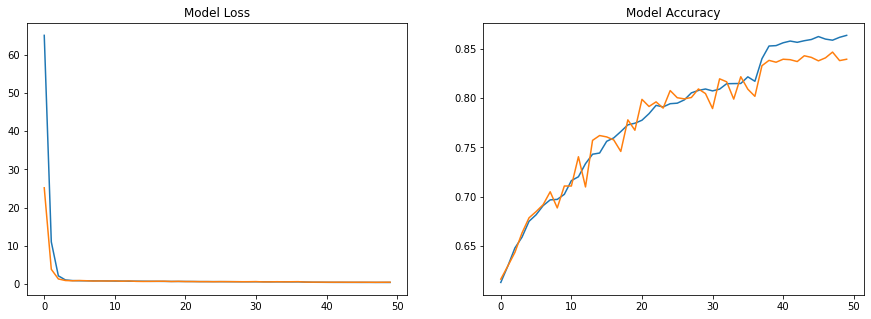

In [30]:
print('train loss:', history.history['loss'][-1])
print('train accuracy:', history.history['accuracy'][-1])

print('dev loss:', history.history['val_loss'][-1])
print('dev accuracy:', history.history['val_accuracy'][-1])

results = pd.DataFrame(history.history)

fig, axs = plt.subplots(1,2,figsize=(15,5))

axs[0].plot(results[['loss', 'val_loss']])
axs[0].set_title('Model Loss')

axs[1].plot(results[['accuracy', 'val_accuracy']])
axs[1].set_title('Model Accuracy')

plt.show()

In [31]:
test = pd.read_csv('./cassava-leaf-disease-classification/sample_submission.csv')

test_path = './cassava-leaf-disease-classification/test_images'
def test_image_path(image):
    return os.path.join(test_path,image)

test['image_id'] = test['image_id'].apply(test_image_path)

test['label'] = test['label'].astype('str')

In [32]:
test.head()

,image_id,label
0,./cassava-leaf-disease-classification/test_ima...,4


In [33]:
test_gen = ImageDataGenerator(rescale=1./255)
test_generator = test_gen.flow_from_dataframe(dataframe=test, directory=None, x_col='image_id', y_col='label',
                                              preprocessing_function=applications.vgg16.preprocess_input,
                                              class_mode='categorical', target_size=(image_size,image_size))

Found 1 validated image filenames belonging to 1 classes.


In [34]:
output = model.predict_generator(test_generator)

Instructions for updating:
Please use Model.predict, which supports generators.
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

In [35]:
print(np.argmax(output))

4


In [36]:
submission = pd.DataFrame()
submission['image_id'] = list(os.listdir('./cassava-leaf-disease-classification/test_images/'))
submission['label'] = np.argmax(output, axis=1)

In [37]:
submission.to_csv("submission.csv", index=False)

In [38]:
submission.head()

,image_id,label
0,2216849948.jpg,4


In [39]:
model.save(save_model_filename)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

In [40]:
pred = model.predict(validation_generator)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executi

Executing op __inference_predict_function_89189 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_89189 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_89189 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_89189 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_89189 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_89189 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_89189 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_89189 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_89189 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_89189 in device /job:localhost/

In [41]:
predictions = np.argmax(pred, axis=1)

In [42]:
predictions

array([4, 3, 4, ..., 4, 4, 2], dtype=int64)

In [43]:
actual = validation_generator.classes

In [44]:
actual

[0,
 3,
 1,
 1,
 3,
 3,
 2,
 0,
 4,
 3,
 3,
 3,
 1,
 3,
 3,
 2,
 3,
 4,
 0,
 3,
 3,
 3,
 1,
 3,
 2,
 2,
 3,
 3,
 2,
 2,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 1,
 1,
 3,
 3,
 3,
 3,
 4,
 1,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 3,
 3,
 2,
 3,
 1,
 3,
 4,
 3,
 3,
 3,
 3,
 4,
 2,
 3,
 4,
 4,
 1,
 0,
 1,
 3,
 1,
 3,
 1,
 4,
 3,
 3,
 3,
 4,
 2,
 3,
 3,
 1,
 3,
 3,
 3,
 3,
 2,
 1,
 3,
 3,
 1,
 1,
 2,
 3,
 2,
 4,
 2,
 2,
 4,
 3,
 3,
 1,
 3,
 0,
 3,
 4,
 4,
 3,
 3,
 3,
 3,
 3,
 0,
 3,
 3,
 1,
 2,
 0,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 4,
 3,
 3,
 4,
 0,
 3,
 2,
 3,
 1,
 0,
 3,
 3,
 3,
 2,
 3,
 2,
 3,
 3,
 3,
 2,
 0,
 3,
 1,
 3,
 3,
 3,
 0,
 3,
 3,
 4,
 3,
 3,
 1,
 2,
 3,
 3,
 3,
 3,
 1,
 3,
 3,
 3,
 3,
 2,
 1,
 3,
 0,
 1,
 4,
 4,
 3,
 3,
 3,
 2,
 3,
 1,
 4,
 3,
 3,
 3,
 3,
 3,
 2,
 3,
 3,
 3,
 0,
 1,
 3,
 1,
 3,
 3,
 1,
 3,
 3,
 4,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 0,
 1,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 2,
 3,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 2,
 4,
 3,
 3,
 3,
 2,
 3,
 3,
 0,
 3,
 4,
 3,
 4,
 2,
 3,


In [45]:
from sklearn.metrics import classification_report

report = classification_report(actual, predictions, target_names=['CBB', 'CBSD', 'CGM', 'CMD', 'Healthy'])

In [47]:
print(report)

              precision    recall  f1-score   support

         CBB       0.49      0.40      0.44       200
        CBSD       0.83      0.66      0.73       436
         CGM       0.77      0.66      0.71       495
         CMD       0.93      0.96      0.95      2638
     Healthy       0.59      0.72      0.65       510

    accuracy                           0.84      4279
   macro avg       0.72      0.68      0.70      4279
weighted avg       0.84      0.84      0.84      4279



In [48]:
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
    verbose=1,
    callbacks=[tensorboard_callback, early_stopping, model_checkpoint]
)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CreateSummaryFileWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteGraphSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executin

116/535 [=====>........................] - ETA: 2:29 - loss: 0.4316 - accuracy: 0.8669Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


204/535 [==========>...................] - ETA: 1:57 - loss: 0.4315 - accuracy: 0.8646Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


292/535 [===============>..............] - ETA: 1:26 - loss: 0.4307 - accuracy: 0.8619Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


380/535 [====================>.........] - ETA: 54s - loss: 0.4295 - accuracy: 0.8619Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


468/535 [=========================>....] - ETA: 23s - loss: 0.4301 - accuracy: 0.8624Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4289 - accuracy: 0.8623Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CreateSummaryFileWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing o

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 92/535 [====>.........................] - ETA: 2:34 - loss: 0.4400 - accuracy: 0.8618Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


180/535 [=========>....................] - ETA: 2:04 - loss: 0.4230 - accuracy: 0.8670Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


268/535 [==============>...............] - ETA: 1:33 - loss: 0.4285 - accuracy: 0.8656Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


356/535 [==================>...........] - ETA: 1:02 - loss: 0.4270 - accuracy: 0.8659Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


444/535 [=======================>......] - ETA: 31s - loss: 0.4269 - accuracy: 0.8648Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


532/535 [============================>.] - ETA: 1s - loss: 0.4262 - accuracy: 0.8643Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4263 - accuracy: 0.8642Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

159/535 [=======>......................] - ETA: 2:11 - loss: 0.4147 - accuracy: 0.8728Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


247/535 [============>.................] - ETA: 1:41 - loss: 0.4103 - accuracy: 0.8701Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


335/535 [=================>............] - ETA: 1:10 - loss: 0.4133 - accuracy: 0.8682Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


423/535 [======================>.......] - ETA: 39s - loss: 0.4176 - accuracy: 0.8650Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


511/535 [===========================>..] - ETA: 8s - loss: 0.4182 - accuracy: 0.8651Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4213 - accuracy: 0.8645Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
535/535 [==============================] - 243s 454ms/step - loss: 0.4213 - accuracy: 0.8645 - val_loss: 0.4673 - val_accuracy: 0.8474
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localh

125/535 [======>.......................] - ETA: 2:23 - loss: 0.4152 - accuracy: 0.8725Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


213/535 [==========>...................] - ETA: 1:53 - loss: 0.4216 - accuracy: 0.8702Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


301/535 [===============>..............] - ETA: 1:22 - loss: 0.4249 - accuracy: 0.8671Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


389/535 [====================>.........] - ETA: 51s - loss: 0.4256 - accuracy: 0.8662Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


477/535 [=========================>....] - ETA: 20s - loss: 0.4265 - accuracy: 0.8657Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4265 - accuracy: 0.8653Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScala

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

104/535 [====>.........................] - ETA: 2:30 - loss: 0.3970 - accuracy: 0.8659Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


192/535 [=========>....................] - ETA: 2:00 - loss: 0.4131 - accuracy: 0.8634Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


280/535 [==============>...............] - ETA: 1:30 - loss: 0.4250 - accuracy: 0.8614Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


368/535 [===================>..........] - ETA: 59s - loss: 0.4192 - accuracy: 0.8641Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


456/535 [========================>.....] - ETA: 27s - loss: 0.4190 - accuracy: 0.8644Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4206 - accuracy: 0.8645Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 6/10
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/535 [===>..........................] - ETA: 2:36 - loss: 0.4251 - accuracy: 0.8607Executing op __inference_train_function_2846 i

171/535 [========>.....................] - ETA: 2:06 - loss: 0.4222 - accuracy: 0.8637Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


259/535 [=============>................] - ETA: 1:36 - loss: 0.4231 - accuracy: 0.8653Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


347/535 [==================>...........] - ETA: 1:05 - loss: 0.4175 - accuracy: 0.8662Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


435/535 [=======================>......] - ETA: 34s - loss: 0.4178 - accuracy: 0.8659Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


523/535 [============================>.] - ETA: 4s - loss: 0.4174 - accuracy: 0.8665Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4181 - accuracy: 0.8665Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Ex

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

106/535 [====>.........................] - ETA: 2:28 - loss: 0.4000 - accuracy: 0.8709Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


194/535 [=========>....................] - ETA: 1:58 - loss: 0.4099 - accuracy: 0.8668Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


282/535 [==============>...............] - ETA: 1:28 - loss: 0.4206 - accuracy: 0.8630Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


370/535 [===================>..........] - ETA: 57s - loss: 0.4165 - accuracy: 0.8644Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


458/535 [========================>.....] - ETA: 26s - loss: 0.4171 - accuracy: 0.8651Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4173 - accuracy: 0.8653Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 8/10
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/535 [=>............................] - ETA: 2:48 - loss: 0.3932 - accuracy: 0.8661Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


130/535 [======>.......................] - ETA: 2:20 - loss: 0.4248 - accuracy: 0.8661Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


218/535 [===========>..................] - ETA: 1:50 - loss: 0.4092 - accuracy: 0.8694Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


306/535 [================>.............] - ETA: 1:20 - loss: 0.4094 - accuracy: 0.8694Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


394/535 [=====================>........] - ETA: 49s - loss: 0.4124 - accuracy: 0.8683Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


482/535 [==========================>...] - ETA: 18s - loss: 0.4162 - accuracy: 0.8666Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4172 - accuracy: 0.8651Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op W

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

153/535 [=======>......................] - ETA: 2:14 - loss: 0.4246 - accuracy: 0.8615Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


241/535 [============>.................] - ETA: 1:43 - loss: 0.4143 - accuracy: 0.8660Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


329/535 [=================>............] - ETA: 1:13 - loss: 0.4182 - accuracy: 0.8637Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


417/535 [======================>.......] - ETA: 41s - loss: 0.4147 - accuracy: 0.8666Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


505/535 [===========================>..] - ETA: 10s - loss: 0.4167 - accuracy: 0.8661Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4178 - accuracy: 0.8652Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

132/535 [======>.......................] - ETA: 2:22 - loss: 0.4072 - accuracy: 0.8676Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


220/535 [===========>..................] - ETA: 1:52 - loss: 0.4085 - accuracy: 0.8676Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


308/535 [================>.............] - ETA: 1:20 - loss: 0.4115 - accuracy: 0.8669Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


396/535 [=====================>........] - ETA: 49s - loss: 0.4121 - accuracy: 0.8659Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


484/535 [==========================>...] - ETA: 18s - loss: 0.4125 - accuracy: 0.8660Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4162 - accuracy: 0.8649Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wr

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

In [53]:
output = model.predict_generator(test_generator)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executi

In [54]:
print(np.argmax(output))

4


In [56]:
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
    verbose=1,
    callbacks=[tensorboard_callback, early_stopping, model_checkpoint]
)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CreateSummaryFileWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteGraphSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executin

117/535 [=====>........................] - ETA: 2:27 - loss: 0.4185 - accuracy: 0.8654Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


205/535 [==========>...................] - ETA: 1:56 - loss: 0.4123 - accuracy: 0.8675Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


293/535 [===============>..............] - ETA: 1:25 - loss: 0.4100 - accuracy: 0.8679Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


381/535 [====================>.........] - ETA: 54s - loss: 0.4142 - accuracy: 0.8674Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


469/535 [=========================>....] - ETA: 23s - loss: 0.4148 - accuracy: 0.8677Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4145 - accuracy: 0.8677Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CreateSummaryFileWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing o

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 93/535 [====>.........................] - ETA: 2:34 - loss: 0.4103 - accuracy: 0.8612Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


181/535 [=========>....................] - ETA: 2:04 - loss: 0.4291 - accuracy: 0.8610Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


269/535 [==============>...............] - ETA: 1:33 - loss: 0.4181 - accuracy: 0.8674Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


357/535 [===================>..........] - ETA: 1:02 - loss: 0.4132 - accuracy: 0.8692Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


445/535 [=======================>......] - ETA: 31s - loss: 0.4114 - accuracy: 0.8698Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


533/535 [============================>.] - ETA: 0s - loss: 0.4105 - accuracy: 0.8701Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4112 - accuracy: 0.8698Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

160/535 [=======>......................] - ETA: 2:11 - loss: 0.4100 - accuracy: 0.8682Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


248/535 [============>.................] - ETA: 1:40 - loss: 0.4111 - accuracy: 0.8687Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


336/535 [=================>............] - ETA: 1:10 - loss: 0.4076 - accuracy: 0.8696Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


424/535 [======================>.......] - ETA: 39s - loss: 0.4078 - accuracy: 0.8705Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


512/535 [===========================>..] - ETA: 8s - loss: 0.4083 - accuracy: 0.8697Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4078 - accuracy: 0.8700Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

139/535 [======>.......................] - ETA: 2:21 - loss: 0.4067 - accuracy: 0.8692Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


227/535 [===========>..................] - ETA: 1:50 - loss: 0.4074 - accuracy: 0.8718Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


315/535 [================>.............] - ETA: 1:18 - loss: 0.4056 - accuracy: 0.8724Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


403/535 [=====================>........] - ETA: 47s - loss: 0.4055 - accuracy: 0.8711Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


491/535 [==========================>...] - ETA: 15s - loss: 0.4083 - accuracy: 0.8695Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4094 - accuracy: 0.8693Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/repli

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

119/535 [=====>........................] - ETA: 2:27 - loss: 0.4159 - accuracy: 0.8687Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


207/535 [==========>...................] - ETA: 1:56 - loss: 0.3980 - accuracy: 0.8727Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


295/535 [===============>..............] - ETA: 1:25 - loss: 0.3953 - accuracy: 0.8736Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


383/535 [====================>.........] - ETA: 54s - loss: 0.4011 - accuracy: 0.8722Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


471/535 [=========================>....] - ETA: 22s - loss: 0.4021 - accuracy: 0.8723Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4059 - accuracy: 0.8709Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 6/10
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/535 [=>............................] - ETA: 2:51 - loss: 0.4167 - accuracy: 0.8709Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


128/535 [======>.......................] - ETA: 2:24 - loss: 0.4146 - accuracy: 0.8710Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


216/535 [===========>..................] - ETA: 1:53 - loss: 0.4178 - accuracy: 0.8700Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


304/535 [================>.............] - ETA: 1:22 - loss: 0.4104 - accuracy: 0.8705Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


392/535 [====================>.........] - ETA: 50s - loss: 0.4055 - accuracy: 0.8704Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


480/535 [=========================>....] - ETA: 19s - loss: 0.4044 - accuracy: 0.8709Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4041 - accuracy: 0.8715Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

107/535 [=====>........................] - ETA: 2:29 - loss: 0.4027 - accuracy: 0.8700Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


195/535 [=========>....................] - ETA: 1:59 - loss: 0.4065 - accuracy: 0.8694Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


283/535 [==============>...............] - ETA: 1:28 - loss: 0.4035 - accuracy: 0.8718Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


371/535 [===================>..........] - ETA: 57s - loss: 0.4092 - accuracy: 0.8688Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


459/535 [========================>.....] - ETA: 26s - loss: 0.4116 - accuracy: 0.8683Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4081 - accuracy: 0.8696Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 8/10
Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0
 87/535 [===>..........................] - ETA: 2:35 - loss: 0.3787 - accuracy: 0.8793Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


175/535 [========>.....................] - ETA: 2:05 - loss: 0.3984 - accuracy: 0.8709Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


263/535 [=============>................] - ETA: 1:35 - loss: 0.3996 - accuracy: 0.8710Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


351/535 [==================>...........] - ETA: 1:04 - loss: 0.4003 - accuracy: 0.8708Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


439/535 [=======================>......] - ETA: 33s - loss: 0.4053 - accuracy: 0.8693Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


527/535 [============================>.] - ETA: 2s - loss: 0.4050 - accuracy: 0.8693Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4048 - accuracy: 0.8693Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Id

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

154/535 [=======>......................] - ETA: 2:15 - loss: 0.3927 - accuracy: 0.8754Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


242/535 [============>.................] - ETA: 1:44 - loss: 0.3916 - accuracy: 0.8755Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


330/535 [=================>............] - ETA: 1:13 - loss: 0.3936 - accuracy: 0.8748Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


418/535 [======================>.......] - ETA: 41s - loss: 0.3942 - accuracy: 0.8744Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


506/535 [===========================>..] - ETA: 10s - loss: 0.4041 - accuracy: 0.8711Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4052 - accuracy: 0.8701Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 89/535 [===>..........................] - ETA: 2:34 - loss: 0.3805 - accuracy: 0.8834Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


177/535 [========>.....................] - ETA: 2:04 - loss: 0.3942 - accuracy: 0.8736Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


265/535 [=============>................] - ETA: 1:34 - loss: 0.3951 - accuracy: 0.8717Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


353/535 [==================>...........] - ETA: 1:03 - loss: 0.3993 - accuracy: 0.8707Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


441/535 [=======================>......] - ETA: 33s - loss: 0.4000 - accuracy: 0.8700Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


529/535 [============================>.] - ETA: 2s - loss: 0.4021 - accuracy: 0.8690Executing op __inference_train_function_2846 in device /job:localhost/replica:0/task:0/device:GPU:0


535/535 [==============================] - ETA: 0s - loss: 0.4023 - accuracy: 0.8687Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:G

Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4204 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

In [58]:
model.save(save_model_filename)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

In [61]:
output = model.predict_generator(test_generator)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executi

In [62]:
print(np.argmax(output))

4


In [63]:
submission = pd.DataFrame()
submission['image_id'] = list(os.listdir('./cassava-leaf-disease-classification/test_images/'))
submission['label'] = np.argmax(output, axis=1)

In [64]:
submission.to_csv("submission.csv", index=False)

In [65]:
submission.head()

,image_id,label
0,2216849948.jpg,4


In [2]:
import keras

model_1 = keras.models.load_model('cassava.h5')

In [24]:
history_1 = model_1.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
    verbose=1,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/10
535/535 [==============================] - ETA: 0s - loss: 0.3995 - accuracy: 0.8733
Epoch 00001: val_loss improved from inf to 0.46704, saving model to cassava.h5
535/535 [==============================] - 326s 609ms/step - loss: 0.3995 - accuracy: 0.8733 - val_loss: 0.4670 - val_accuracy: 0.8441
Epoch 2/10
535/535 [==============================] - ETA: 0s - loss: 0.4009 - accuracy: 0.8736
Epoch 00002: val_loss did not improve from 0.46704
535/535 [==============================] - 238s 444ms/step - loss: 0.4009 - accuracy: 0.8736 - val_loss: 0.4739 - val_accuracy: 0.8465
Epoch 3/10
535/535 [==============================] - ETA: 0s - loss: 0.3938 - accuracy: 0.8737
Epoch 00003: val_loss did not improve from 0.46704
535/535 [==============================] - 235s 439ms/step - loss: 0.3938 - accuracy: 0.8737 - val_loss: 0.4747 - val_accuracy: 0.8394
Epoch 4/10
535/535 [==============================] - ETA: 0s - loss: 0.3941 - accuracy: 0.8738
Epoch 00004: val_loss improved

In [ ]:
# 80 epochs in total

In [27]:
final_model = keras.models.load_model('epoch_79.h5')

In [43]:
output = final_model.predict_generator(test_generator)

In [44]:
print(np.argmax(output))

4


In [45]:
submission = pd.DataFrame()
submission['image_id'] = list(os.listdir('./cassava-leaf-disease-classification/test_images/'))
submission['label'] = np.argmax(output, axis=1)
submission.to_csv("submission.csv", index=False)

In [46]:
pred = final_model.predict(validation_generator)
predictions = np.argmax(pred, axis=1)

In [47]:
actual = validation_generator.classes

In [48]:
print(predictions)
print(actual)

[0 3 4 ... 4 4 4]
[0, 3, 1, 1, 3, 3, 2, 0, 4, 3, 3, 3, 1, 3, 3, 2, 3, 4, 0, 3, 3, 3, 1, 3, 2, 2, 3, 3, 2, 2, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 3, 3, 3, 3, 4, 1, 3, 3, 3, 2, 3, 3, 3, 3, 3, 2, 3, 1, 3, 4, 3, 3, 3, 3, 4, 2, 3, 4, 4, 1, 0, 1, 3, 1, 3, 1, 4, 3, 3, 3, 4, 2, 3, 3, 1, 3, 3, 3, 3, 2, 1, 3, 3, 1, 1, 2, 3, 2, 4, 2, 2, 4, 3, 3, 1, 3, 0, 3, 4, 4, 3, 3, 3, 3, 3, 0, 3, 3, 1, 2, 0, 3, 3, 3, 3, 3, 3, 4, 3, 4, 3, 3, 4, 0, 3, 2, 3, 1, 0, 3, 3, 3, 2, 3, 2, 3, 3, 3, 2, 0, 3, 1, 3, 3, 3, 0, 3, 3, 4, 3, 3, 1, 2, 3, 3, 3, 3, 1, 3, 3, 3, 3, 2, 1, 3, 0, 1, 4, 4, 3, 3, 3, 2, 3, 1, 4, 3, 3, 3, 3, 3, 2, 3, 3, 3, 0, 1, 3, 1, 3, 3, 1, 3, 3, 4, 4, 3, 3, 3, 3, 3, 3, 0, 1, 3, 3, 3, 3, 3, 3, 3, 2, 3, 2, 3, 3, 3, 3, 3, 3, 4, 3, 2, 4, 3, 3, 3, 2, 3, 3, 0, 3, 4, 3, 4, 2, 3, 3, 4, 3, 3, 4, 3, 2, 3, 3, 1, 2, 4, 3, 3, 3, 4, 3, 4, 3, 3, 3, 3, 2, 4, 0, 3, 2, 3, 2, 3, 3, 3, 4, 3, 3, 3, 3, 3, 1, 3, 4, 0, 3, 0, 1, 0, 3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 1, 2, 2, 2, 3, 1, 2, 3, 3, 3, 3, 4, 3, 3, 4, 0, 3, 3, 1, 2, 3, 

In [49]:
from sklearn.metrics import classification_report

report = classification_report(actual, predictions, target_names=['CBB', 'CBSD', 'CGM', 'CMD', 'Healthy'])

print(report)

              precision    recall  f1-score   support

         CBB       0.60      0.43      0.50       200
        CBSD       0.78      0.76      0.77       436
         CGM       0.79      0.65      0.71       495
         CMD       0.93      0.96      0.95      2638
     Healthy       0.63      0.71      0.66       510

    accuracy                           0.85      4279
   macro avg       0.75      0.70      0.72      4279
weighted avg       0.85      0.85      0.85      4279

